In [69]:
import pandas as pd
import pandas_profiling as pdpro
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from warnings import filterwarnings
from mpl_toolkits.mplot3d import Axes3D
import statsmodels.api as sm
import missingno as msno
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
from sklearn.neighbors import LocalOutlierFactor
from scipy.stats import levene
from scipy.stats import shapiro
from scipy.stats.stats import pearsonr
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict
from sklearn.preprocessing import scale
from sklearn.model_selection import ShuffleSplit, GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn import model_selection
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import BaggingRegressor
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPRegressor
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LinearRegression
from sklearn.cross_decomposition import PLSRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import ElasticNetCV
from sklearn import linear_model
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.ensemble import GradientBoostingRegressor, GradientBoostingClassifier
import xgboost as xgb
from xgboost import XGBRegressor, XGBClassifier
from lightgbm import LGBMRegressor, LGBMClassifier
from catboost import CatBoostRegressor, CatBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn import tree
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, roc_auc_score, roc_curve

In [2]:
filterwarnings("ignore")

In [3]:
df = pd.read_csv("train.csv")

In [4]:
pdpro.ProfileReport(df)

In [5]:
df.head()

,bedroom,bathrooms,area,furnishing,avalable_for,address,floor_number,facing,floor_type,gate_community,...,pooja_room,study_room,others,servant_room,store_room,maintenance_amt,brok_amt,deposit_amt,mnt_amt,rent
0,2,2,1050.0,Unfurnished,All,"Sadguru hights, Pingale Wasti, , Pune, Maharas...",5,West,Marble,Yes,...,0,0,0,0,0,0,0,3,0.0,20000.0
1,2,2,760.0,Unfurnished,All,"Manav Silver Springs, Wagholi, , Pune, Maharas...",5,East,Vitrified,Yes,...,0,0,0,0,0,0,0,40000,0.0,14000.0
2,3,3,0.0,Semifurnished,All,"Saarrthi Souvenir, Mahalunge, , Pune, Maharashtra",1,South-West,Vitrified,Yes,...,0,0,1,0,0,Maintenance 1/ (/ month,23000,60000,1.0,22999.0
3,1,1,628.0,Furnished,Family Only,"Dhan Residency, Wanowrie, , Pune, Maharashtra",3,East,Mosaic,Yes,...,0,0,0,0,0,0,0,40000,0.0,13000.0
4,2,2,668.0,Semifurnished,"Family , Bachelors (Men Only)","Saptsiddhi Savali Homes, Uruli Devachi, , Pune...",6,South,Polished concrete,Yes,...,0,0,0,0,0,0,0,20,0.0,7500.0


In [6]:
df.shape

(10884, 30)

In [40]:
df['furnishing'] = np.where(df['furnishing'] == 'Unfurnishe', 'Unfurnished', df['furnishing'])
df['furnishing'].unique()

array(['Unfurnished', 'Semifurnished', 'Furnished'], dtype=object)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10884 entries, 0 to 10883
Data columns (total 30 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   bedroom            10884 non-null  int64  
 1   bathrooms          10884 non-null  int64  
 2   area               10884 non-null  float64
 3   furnishing         10884 non-null  object 
 4   avalable_for       10884 non-null  object 
 5   address            10884 non-null  object 
 6   floor_number       10884 non-null  int64  
 7   facing             10884 non-null  object 
 8   floor_type         10884 non-null  object 
 9   gate_community     10884 non-null  object 
 10  corner_pro         10884 non-null  object 
 11  parking            10884 non-null  int64  
 12  wheelchairadption  10884 non-null  object 
 13  petfacility        10884 non-null  object 
 14  aggDur             10884 non-null  int64  
 15  noticeDur          10884 non-null  int64  
 16  lightbill          108

In [8]:
df.describe()

,bedroom,bathrooms,area,floor_number,parking,aggDur,noticeDur,lightbill,powerbackup,no_room,pooja_room,study_room,others,servant_room,store_room,brok_amt,deposit_amt,mnt_amt,rent
count,10884.000000,10884.000000,10884.000000,10884.000000,10884.000000,10884.000000,10884.000000,10884.000000,10884.000000,10884.000000,10884.000000,10884.000000,10884.000000,10884.000000,10884.000000,10884.000000,1.088400e+04,10884.000000,1.088400e+04
mean,1.797868,1.779677,528.558560,3.062018,0.884693,7.423649,0.722345,0.172639,0.712422,0.750276,0.062201,0.048144,0.124495,0.032157,0.045296,7075.270764,3.670939e+04,257.493025,2.855947e+04
std,0.807328,0.832231,930.460935,2.390430,0.559457,7.670543,0.698966,0.377952,0.842667,0.432873,0.241532,0.214080,0.330160,0.176426,0.207962,17269.507644,5.589578e+04,1247.938097,1.183249e+06
min,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,1.600000e+03
25%,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000e+00,0.000000,1.050000e+04
50%,2.000000,2.000000,510.000000,3.000000,1.000000,11.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000e+04,0.000000,1.500000e+04
75%,2.000000,2.000000,840.000000,5.000000,1.000000,11.000000,1.000000,0.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9000.000000,5.000000e+04,0.000000,2.100000e+04
max,22.000000,22.000000,72775.000000,9.000000,9.000000,36.000000,6.000000,1.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,275000.000000,1.500000e+06,40000.000000,1.234568e+08


In [9]:
df.corr()

,bedroom,bathrooms,area,floor_number,parking,aggDur,noticeDur,lightbill,powerbackup,no_room,pooja_room,study_room,others,servant_room,store_room,brok_amt,deposit_amt,mnt_amt,rent
bedroom,1.000000,0.899779,0.253111,0.176808,0.280812,0.115544,0.076232,-0.045229,0.273958,-0.235426,0.137052,0.107880,0.078904,0.259174,0.122402,0.408935,0.318559,0.134750,0.008101
bathrooms,0.899779,1.000000,0.258014,0.196426,0.300861,0.138541,0.074429,-0.063687,0.312543,-0.252216,0.143609,0.112663,0.084452,0.334255,0.125094,0.466772,0.341738,0.158508,0.008212
area,0.253111,0.258014,1.000000,0.075087,0.116009,0.167219,0.147517,-0.061085,0.178895,-0.150011,0.078293,0.063706,0.050980,0.100551,0.097464,0.206641,0.136232,0.078375,-0.003696
floor_number,0.176808,0.196426,0.075087,1.000000,0.072270,0.097254,0.081965,-0.053449,0.257600,-0.126402,0.041381,0.017507,0.070783,0.037975,0.049430,0.135788,0.088741,0.065852,0.001065
parking,0.280812,0.300861,0.116009,0.072270,1.000000,0.136773,0.105633,-0.034912,0.212662,-0.186450,0.094563,0.080112,0.096130,0.180936,0.055163,0.233572,0.154849,0.065900,0.004291
aggDur,0.115544,0.138541,0.167219,0.097254,0.136773,1.000000,0.530711,-0.169474,0.257547,-0.198710,0.109667,0.069106,0.096474,0.095990,0.101216,0.213412,0.134850,0.098333,0.005875
noticeDur,0.076232,0.074429,0.147517,0.081965,0.105633,0.530711,1.000000,-0.115229,0.211690,-0.146583,0.054957,0.039602,0.077732,0.033665,0.087162,0.101725,0.072605,0.063578,0.004536
lightbill,-0.045229,-0.063687,-0.061085,-0.053449,-0.034912,-0.169474,-0.115229,1.000000,-0.094239,0.069211,-0.047184,-0.013017,-0.003627,-0.019876,-0.078456,-0.110731,-0.077248,-0.023525,-0.004891
powerbackup,0.273958,0.312543,0.178895,0.257600,0.212662,0.257547,0.211690,-0.094239,1.000000,-0.329651,0.155614,0.125653,0.167999,0.160482,0.197558,0.362251,0.157672,0.091557,0.017148
no_room,-0.235426,-0.252216,-0.150011,-0.126402,-0.186450,-0.198710,-0.146583,0.069211,-0.329651,1.000000,-0.446401,-0.389821,-0.653621,-0.315949,-0.377550,-0.359400,-0.170434,-0.148358,0.003329


In [10]:
df.bedroom.value_counts()

2     4936
1     4219
3     1504
4      202
5       17
7        2
22       1
6        1
20       1
10       1
Name: bedroom, dtype: int64

In [11]:
df.bathrooms.value_counts()

2     5018
1     4348
3     1235
4      192
5       67
6       18
7        4
22       1
20       1
Name: bathrooms, dtype: int64

In [12]:
df.furnishing.value_counts()

Unfurnished      4758
Semifurnished    4261
Furnished        1861
Unfurnishe          4
Name: furnishing, dtype: int64

In [13]:
df.avalable_for.value_counts()

All                                5391
Family Only                        4449
Family , Bachelors (Women Only)     447
Family , Bachelors (Men Only)       277
Bachelors (Men/Women)               121
Bachelors (Men Only)                 94
Bachelors (Women Only)               75
None                                 30
Name: avalable_for, dtype: int64

In [14]:
df.floor_number.value_counts()

1    2462
2    1748
3    1515
0    1180
4    1165
5     933
6     678
7     531
9     338
8     334
Name: floor_number, dtype: int64

In [15]:
df.parking.value_counts()

1    8063
0    2121
2     604
3      53
4      26
5      12
6       3
9       1
8       1
Name: parking, dtype: int64

In [16]:
df.propertyage.value_counts()

1 to 5 Year Old       3744
5 to 10 Year Old      3322
10+ Year Old          2182
0 to 1 Year Old       1454
Under Construction     171
NO age                  11
Name: propertyage, dtype: int64

In [17]:
df.powerbackup.value_counts()

0    5879
2    2749
1    2256
Name: powerbackup, dtype: int64

In [18]:
df.pooja_room.value_counts()

0    10207
1      677
Name: pooja_room, dtype: int64

In [19]:
df.servant_room.value_counts()

0    10534
1      350
Name: servant_room, dtype: int64

In [20]:
df.store_room.value_counts()

0    10391
1      493
Name: store_room, dtype: int64

In [21]:
df.facing.value_counts()

East            3963
No Direction    3521
West            1004
North            713
North-East       553
South            377
North-West       269
South-East       244
South-West       240
Name: facing, dtype: int64

In [22]:
df.floor_type.value_counts()

Not provided         4344
Vitrified            3668
Ceramic              1036
Marble                804
Mosaic                246
Others                208
Spartex               180
Granite               165
Wood                   72
Concrete               65
Polished concrete      34
Cement                 26
Vinyl                  20
Stone                  12
IPSFinish               4
Name: floor_type, dtype: int64

In [23]:
print(df.groupby(["bedroom","area"])["rent"].mean())

bedroom  area    
1        0.00        10140.760247
         24.30        6750.000000
         25.00        2700.000000
         25.12        6000.000000
         27.79        9000.000000
                         ...     
6        0.00        15000.000000
7        0.00        15500.000000
10       0.00        24768.735990
20       20000.00    24768.735990
22       0.00        24768.735990
Name: rent, Length: 1167, dtype: float64


In [24]:
print(df.groupby(["bedroom","furnishing"])["rent"].mean())

bedroom  furnishing   
1        Furnished         13967.082320
         Semifurnished     11473.576744
         Unfurnishe         8833.333333
         Unfurnished        9384.520658
2        Furnished        155873.072069
         Semifurnished     18033.395037
         Unfurnishe        20000.000000
         Unfurnished       15681.181174
3        Furnished         35047.357994
         Semifurnished     27895.946011
         Unfurnished       26264.588680
4        Furnished         48298.381557
         Semifurnished     45173.912744
         Unfurnished       43963.330843
5        Furnished         49089.578663
         Semifurnished     62000.000000
         Unfurnished       30845.823993
6        Semifurnished     15000.000000
7        Furnished          6000.000000
         Unfurnished       25000.000000
10       Unfurnished       24768.735990
20       Semifurnished     24768.735990
22       Unfurnished       24768.735990
Name: rent, dtype: float64


In [25]:
print(df.groupby(["bedroom","floor_number"])["rent"].mean())

bedroom  floor_number
1        0                 8974.599578
         1                10578.847959
         2                10676.280048
         3                10765.970679
         4                11171.325243
         5                11886.118943
         6                11655.599536
         7                12319.000000
         8                12004.145833
         9                12215.178571
2        0                16575.753247
         1                17856.277894
         2                18044.964794
         3               202030.755589
         4                17895.646957
         5                18842.725528
         6                18027.681818
         7                18125.477419
         8                18403.822967
         9                17887.731366
3        0                30953.373725
         1                28730.348504
         2                29141.170886
         3                28717.211111
         4                28539.176488
   

In [26]:
print(df.groupby(["bedroom","facing"])["rent"].mean())

bedroom  facing      
1        East            1.095889e+04
         No Direction    1.043983e+04
         North           1.051751e+04
         North-East      1.059510e+04
         North-West      1.040932e+04
         South           9.739883e+03
         South-East      1.029245e+04
         South-West      1.007087e+04
         West            1.052192e+04
2        East            1.848692e+04
         No Direction    1.754437e+04
         North           1.878098e+04
         North-East      1.804108e+04
         North-West      1.660086e+04
         South           1.723545e+04
         South-East      1.770364e+04
         South-West      1.264424e+06
         West            1.799562e+04
3        East            3.026017e+04
         No Direction    2.733022e+04
         North           3.279038e+04
         North-East      2.784003e+04
         North-West      2.990889e+04
         South           2.552273e+04
         South-East      2.919643e+04
         South-West      2.6

In [27]:
print(df.groupby(["bedroom","floor_type"])["rent"].mean())

bedroom  floor_type  
1        Cement          10000.000000
         Ceramic         10913.852130
         Concrete         9878.787879
         Granite          8747.619048
         IPSFinish        9500.000000
                             ...     
7        Not provided    25000.000000
         Vinyl            6000.000000
10       Not provided    24768.735990
20       Not provided    24768.735990
22       Not provided    24768.735990
Name: rent, Length: 61, dtype: float64


In [28]:
print(df.groupby(["bedroom","gate_community"])["rent"].mean())

bedroom  gate_community
1        No                 9893.555950
         Yes               11328.757379
2        No                17120.305753
         Yes               58222.037354
3        No                27557.097288
         Yes               29556.523743
4        No                49775.517331
         Yes               45049.583114
5        No                44922.911997
         Yes               47279.540360
6        Yes               15000.000000
7        No                25000.000000
         Yes                6000.000000
10       Yes               24768.735990
20       No                24768.735990
22       No                24768.735990
Name: rent, dtype: float64


In [29]:
print(df.groupby(["bedroom","parking"])["rent"].mean())

bedroom  parking
1        0          10166.636117
         1          10848.518917
         2           9543.017241
         3          10511.764706
         4           7708.333333
         5           6250.000000
         6          12000.000000
         8          12000.000000
         9           4000.000000
2        0          16263.410959
         1          48261.860561
         2          19311.104167
         3          19090.000000
         4          14083.333333
         5           6666.666667
         6          14500.000000
3        0          26581.395349
         1          27803.238962
         2          35528.853564
         3          37721.091999
         5          12333.333333
4        0          52096.091999
         1          42535.239279
         2          50081.046806
         3          43943.325861
         4          37759.367995
         5          24884.367995
         6          24768.735990
5        1          45538.275996
         2          54294.

In [30]:
print(df.groupby(["bedroom","propertyage"])["rent"].mean())

bedroom  propertyage       
1        0 to 1 Year Old        9552.575722
         1 to 5 Year Old        9633.532503
         10+ Year Old          11933.319190
         5 to 10 Year Old      10948.334522
         NO age                 9666.666667
         Under Construction    11941.176471
2        0 to 1 Year Old       16065.635783
         1 to 5 Year Old       85484.952155
         10+ Year Old          20103.088136
         5 to 10 Year Old      18756.589784
         NO age                18000.000000
         Under Construction    18506.224490
3        0 to 1 Year Old       27707.640808
         1 to 5 Year Old       27496.525183
         10+ Year Old          30811.850528
         5 to 10 Year Old      30276.039955
         NO age                26750.000000
         Under Construction    26661.451613
4        0 to 1 Year Old       47610.245933
         1 to 5 Year Old       45755.275583
         10+ Year Old          50614.319998
         5 to 10 Year Old      42850.072490
    

In [31]:
print(df.groupby(["bedroom","study_room"])["rent"].mean())

bedroom  study_room
1        0             10548.626121
         1             11358.061538
2        0             44113.958086
         1             19352.755760
3        0             28702.921180
         1             32051.490429
4        0             46683.588603
         1             43893.743563
5        0             51093.300569
         1             24768.735990
6        1             15000.000000
7        0             25000.000000
         1              6000.000000
10       0             24768.735990
20       0             24768.735990
22       0             24768.735990
Name: rent, dtype: float64


In [32]:
print(df.groupby(["bedroom","servant_room"])["rent"].mean())

bedroom  servant_room
1        0               10585.601680
         1                9505.319149
2        0               43315.562328
         1               19039.300610
3        0               28042.054379
         1               39894.517639
4        0               47617.542740
         1               45034.507323
5        0               45530.620797
         1               47758.029710
6        1               15000.000000
7        0               25000.000000
         1                6000.000000
10       0               24768.735990
20       0               24768.735990
22       0               24768.735990
Name: rent, dtype: float64


In [33]:
df.columns

Index(['bedroom', 'bathrooms', 'area', 'furnishing', 'avalable_for', 'address',
       'floor_number', 'facing', 'floor_type', 'gate_community', 'corner_pro',
       'parking', 'wheelchairadption', 'petfacility', 'aggDur', 'noticeDur',
       'lightbill', 'powerbackup', 'propertyage', 'no_room', 'pooja_room',
       'study_room', 'others', 'servant_room', 'store_room', 'maintenance_amt',
       'brok_amt', 'deposit_amt', 'mnt_amt', 'rent'],
      dtype='object')

In [34]:
print(df.groupby(["bedroom","store_room"])["rent"].mean())

bedroom  store_room
1        0             10567.108688
         1             10883.953488
2        0             44114.954484
         1             19331.087558
3        0             28810.744030
         1             30486.416185
4        0             46365.881316
         1             43576.781711
5        0             44988.834282
         1             53256.245330
6        0             15000.000000
7        0             15500.000000
10       0             24768.735990
20       0             24768.735990
22       0             24768.735990
Name: rent, dtype: float64


In [35]:
print(df.isnull().sum())

bedroom              0
bathrooms            0
area                 0
furnishing           0
avalable_for         0
address              0
floor_number         0
facing               0
floor_type           0
gate_community       0
corner_pro           0
parking              0
wheelchairadption    0
petfacility          0
aggDur               0
noticeDur            0
lightbill            0
powerbackup          0
propertyage          0
no_room              0
pooja_room           0
study_room           0
others               0
servant_room         0
store_room           0
maintenance_amt      0
brok_amt             0
deposit_amt          0
mnt_amt              0
rent                 0
dtype: int64


In [36]:
corrPearson = df.corr(method="pearson")
corrPearson

,bedroom,bathrooms,area,floor_number,parking,aggDur,noticeDur,lightbill,powerbackup,no_room,pooja_room,study_room,others,servant_room,store_room,brok_amt,deposit_amt,mnt_amt,rent
bedroom,1.000000,0.899779,0.253111,0.176808,0.280812,0.115544,0.076232,-0.045229,0.273958,-0.235426,0.137052,0.107880,0.078904,0.259174,0.122402,0.408935,0.318559,0.134750,0.008101
bathrooms,0.899779,1.000000,0.258014,0.196426,0.300861,0.138541,0.074429,-0.063687,0.312543,-0.252216,0.143609,0.112663,0.084452,0.334255,0.125094,0.466772,0.341738,0.158508,0.008212
area,0.253111,0.258014,1.000000,0.075087,0.116009,0.167219,0.147517,-0.061085,0.178895,-0.150011,0.078293,0.063706,0.050980,0.100551,0.097464,0.206641,0.136232,0.078375,-0.003696
floor_number,0.176808,0.196426,0.075087,1.000000,0.072270,0.097254,0.081965,-0.053449,0.257600,-0.126402,0.041381,0.017507,0.070783,0.037975,0.049430,0.135788,0.088741,0.065852,0.001065
parking,0.280812,0.300861,0.116009,0.072270,1.000000,0.136773,0.105633,-0.034912,0.212662,-0.186450,0.094563,0.080112,0.096130,0.180936,0.055163,0.233572,0.154849,0.065900,0.004291
aggDur,0.115544,0.138541,0.167219,0.097254,0.136773,1.000000,0.530711,-0.169474,0.257547,-0.198710,0.109667,0.069106,0.096474,0.095990,0.101216,0.213412,0.134850,0.098333,0.005875
noticeDur,0.076232,0.074429,0.147517,0.081965,0.105633,0.530711,1.000000,-0.115229,0.211690,-0.146583,0.054957,0.039602,0.077732,0.033665,0.087162,0.101725,0.072605,0.063578,0.004536
lightbill,-0.045229,-0.063687,-0.061085,-0.053449,-0.034912,-0.169474,-0.115229,1.000000,-0.094239,0.069211,-0.047184,-0.013017,-0.003627,-0.019876,-0.078456,-0.110731,-0.077248,-0.023525,-0.004891
powerbackup,0.273958,0.312543,0.178895,0.257600,0.212662,0.257547,0.211690,-0.094239,1.000000,-0.329651,0.155614,0.125653,0.167999,0.160482,0.197558,0.362251,0.157672,0.091557,0.017148
no_room,-0.235426,-0.252216,-0.150011,-0.126402,-0.186450,-0.198710,-0.146583,0.069211,-0.329651,1.000000,-0.446401,-0.389821,-0.653621,-0.315949,-0.377550,-0.359400,-0.170434,-0.148358,0.003329


In [37]:
corrSpearman = df.corr(method="spearman")
corrSpearman

,bedroom,bathrooms,area,floor_number,parking,aggDur,noticeDur,lightbill,powerbackup,no_room,pooja_room,study_room,others,servant_room,store_room,brok_amt,deposit_amt,mnt_amt,rent
bedroom,1.000000,0.883693,0.346264,0.210862,0.308606,0.099754,0.083397,-0.053024,0.303576,-0.232977,0.128355,0.098570,0.084561,0.200301,0.129468,0.331536,0.299551,0.057035,0.731321
bathrooms,0.883693,1.000000,0.344927,0.239975,0.327145,0.118779,0.092044,-0.071997,0.347237,-0.233492,0.127726,0.094354,0.081963,0.208842,0.133613,0.359645,0.290797,0.050603,0.706369
area,0.346264,0.344927,1.000000,0.155556,0.198604,0.317581,0.316646,-0.110084,0.320577,-0.210562,0.123891,0.093540,0.045313,0.083686,0.166513,0.326697,0.185173,0.132105,0.319080
floor_number,0.210862,0.239975,0.155556,1.000000,0.097374,0.105150,0.104971,-0.055069,0.264200,-0.122512,0.032512,0.011301,0.073528,0.023431,0.049855,0.200255,0.150292,0.070699,0.220333
parking,0.308606,0.327145,0.198604,0.097374,1.000000,0.144857,0.135897,-0.039788,0.253069,-0.204336,0.100538,0.083057,0.111512,0.167713,0.066833,0.236340,0.138627,0.067656,0.285456
aggDur,0.099754,0.118779,0.317581,0.105150,0.144857,1.000000,0.661499,-0.177458,0.288191,-0.196040,0.107896,0.062003,0.083037,0.070195,0.114215,0.234323,0.173558,0.148448,0.133436
noticeDur,0.083397,0.092044,0.316646,0.104971,0.135897,0.661499,1.000000,-0.151414,0.285281,-0.172139,0.075992,0.054285,0.071667,0.039252,0.117969,0.195627,0.149359,0.132122,0.119963
lightbill,-0.053024,-0.071997,-0.110084,-0.055069,-0.039788,-0.177458,-0.151414,1.000000,-0.098225,0.069211,-0.047184,-0.013017,-0.003627,-0.019876,-0.078456,-0.159075,-0.177598,-0.056183,-0.078790
powerbackup,0.303576,0.347237,0.320577,0.264200,0.253069,0.288191,0.285281,-0.098225,1.000000,-0.333368,0.152757,0.126153,0.176673,0.156160,0.191027,0.508746,0.203201,0.097462,0.330145
no_room,-0.232977,-0.233492,-0.210562,-0.122512,-0.204336,-0.196040,-0.172139,0.069211,-0.333368,1.000000,-0.446401,-0.389821,-0.653621,-0.315949,-0.377550,-0.458279,-0.140875,-0.204163,-0.218878


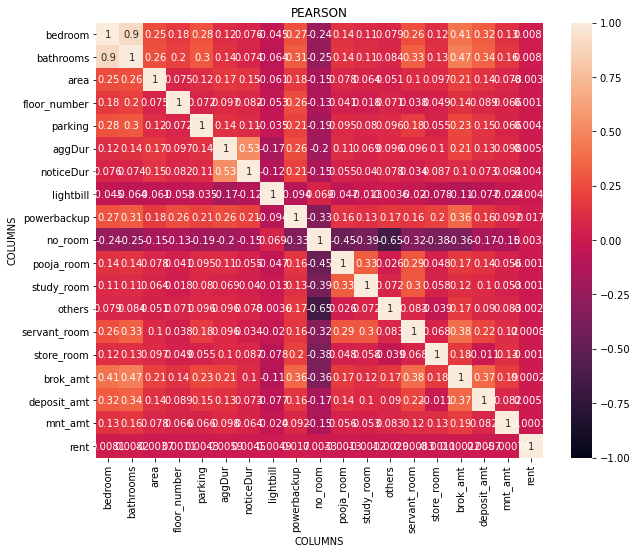

In [38]:
figure = plt.figure(figsize=(10,8))
sns.heatmap(corrPearson,annot=True, vmin=-1, vmax=+1)
plt.title("PEARSON")
plt.xlabel("COLUMNS")
plt.ylabel("COLUMNS")
plt.show()

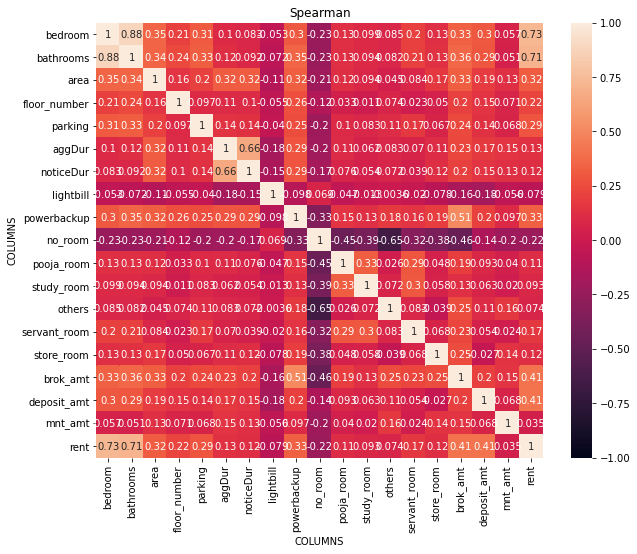

In [39]:
figure = plt.figure(figsize=(10,8))
sns.heatmap(corrSpearman,annot=True, vmin=-1, vmax=+1)
plt.title("Spearman")
plt.xlabel("COLUMNS")
plt.ylabel("COLUMNS")
plt.show()

In [54]:
target = 'rent'

In [55]:
num_features = [feature for feature in df.columns 
                            if df[feature].dtype != 'O' and feature != target]

In [56]:
df[num_features].head()

,bedroom,bathrooms,area,floor_number,parking,aggDur,noticeDur,lightbill,powerbackup,no_room,pooja_room,study_room,others,servant_room,store_room,brok_amt,deposit_amt,mnt_amt
0,2,2,1050.0,5,0,11,2,0,2,1,0,0,0,0,0,0,3,0.0
1,2,2,760.0,5,2,11,1,0,2,1,0,0,0,0,0,0,40000,0.0
2,3,3,0.0,1,1,11,1,0,2,0,0,0,1,0,0,23000,60000,1.0
3,1,1,628.0,3,1,11,1,0,0,1,0,0,0,0,0,0,40000,0.0
4,2,2,668.0,6,1,12,1,1,1,1,0,0,0,0,0,0,20,0.0


In [57]:
dis_features = [feature for feature in num_features if len(df[feature].unique()) < 20 and feature != target]

print(dis_features)

['bedroom', 'bathrooms', 'floor_number', 'parking', 'noticeDur', 'lightbill', 'powerbackup', 'no_room', 'pooja_room', 'study_room', 'others', 'servant_room', 'store_room']


In [58]:
con_features = [feature for feature in num_features if feature not in dis_features and feature != target]

print(con_features)

['area', 'aggDur', 'brok_amt', 'deposit_amt', 'mnt_amt']


In [59]:
for i in dis_features:
    print(i)
    print(shapiro(df[i]))

bedroom
ShapiroResult(statistic=0.7436956763267517, pvalue=0.0)
bathrooms
ShapiroResult(statistic=0.7284057140350342, pvalue=0.0)
floor_number
ShapiroResult(statistic=0.9136949777603149, pvalue=0.0)
parking
ShapiroResult(statistic=0.6340826749801636, pvalue=0.0)
noticeDur
ShapiroResult(statistic=0.737760066986084, pvalue=0.0)
lightbill
ShapiroResult(statistic=0.4572291374206543, pvalue=0.0)
powerbackup
ShapiroResult(statistic=0.7228794097900391, pvalue=0.0)
no_room
ShapiroResult(statistic=0.5383070707321167, pvalue=0.0)
pooja_room
ShapiroResult(statistic=0.25734323263168335, pvalue=0.0)
study_room
ShapiroResult(statistic=0.2184809446334839, pvalue=0.0)
others
ShapiroResult(statistic=0.38658469915390015, pvalue=0.0)
servant_room
ShapiroResult(statistic=0.16684597730636597, pvalue=0.0)
store_room
ShapiroResult(statistic=0.20994162559509277, pvalue=0.0)


In [60]:
for i in con_features:
    print(i)
    print(shapiro(df[i]))

area
ShapiroResult(statistic=0.3261641263961792, pvalue=0.0)
aggDur
ShapiroResult(statistic=0.7586420774459839, pvalue=0.0)
brok_amt
ShapiroResult(statistic=0.4545252323150635, pvalue=0.0)
deposit_amt
ShapiroResult(statistic=0.4995344281196594, pvalue=0.0)
mnt_amt
ShapiroResult(statistic=0.1904563307762146, pvalue=0.0)


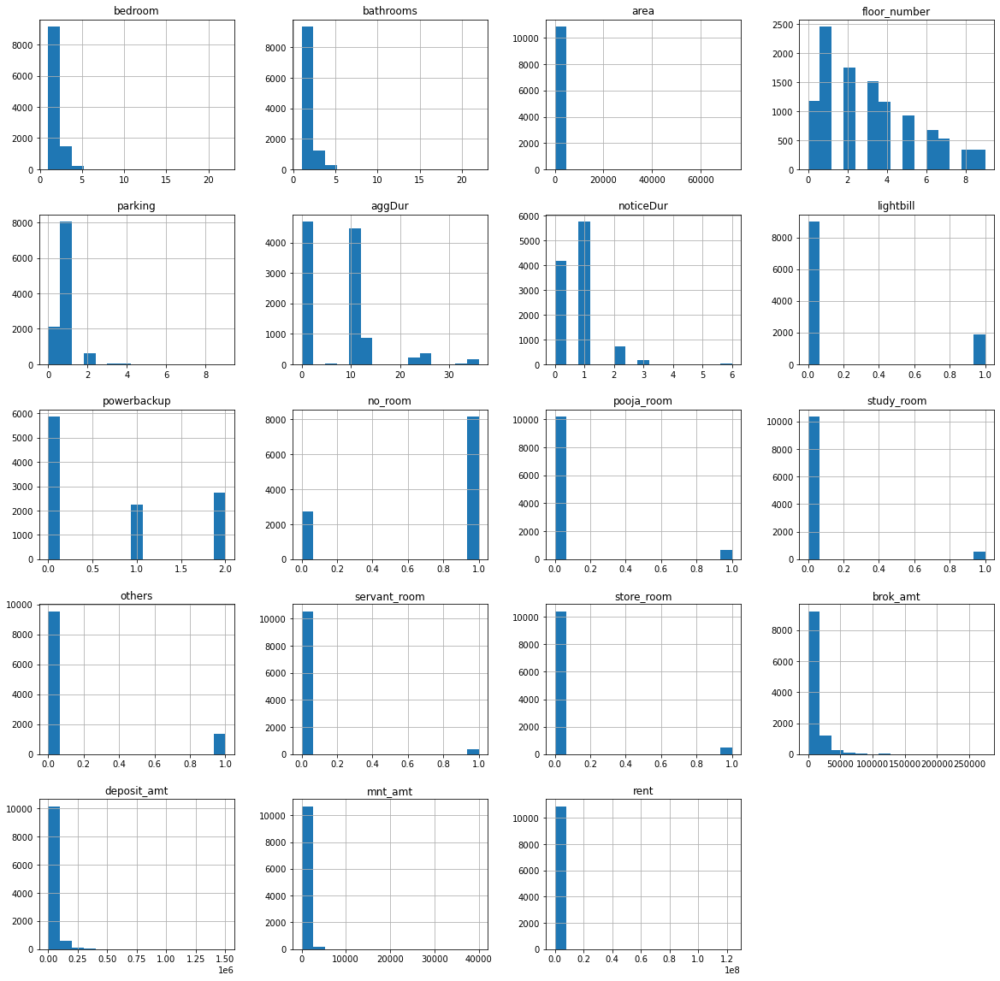

In [61]:
df.hist(figsize=(20,20),grid = True,sharex=False,bins=15)
plt.show()

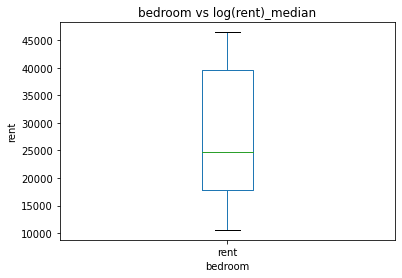

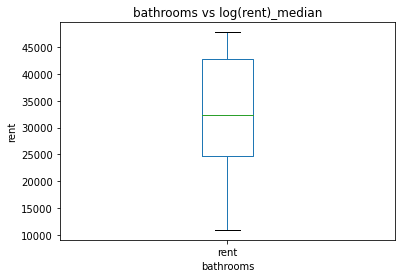

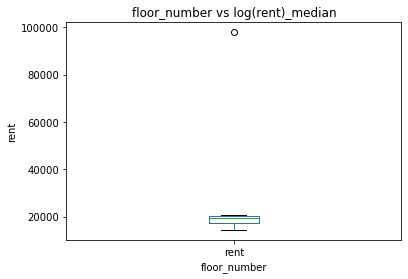

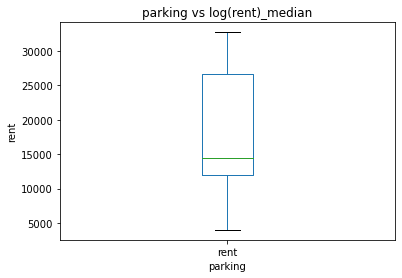

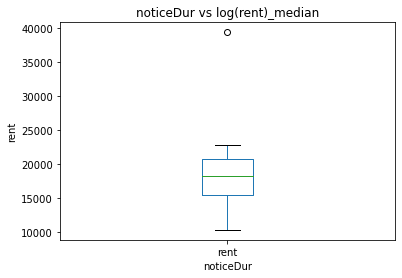

...

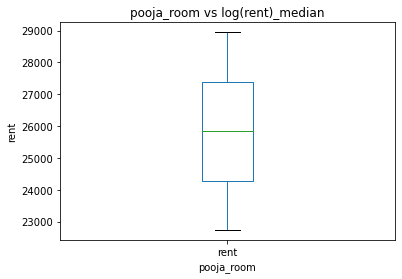

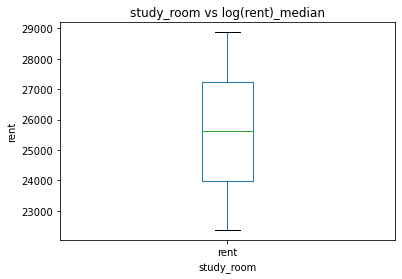

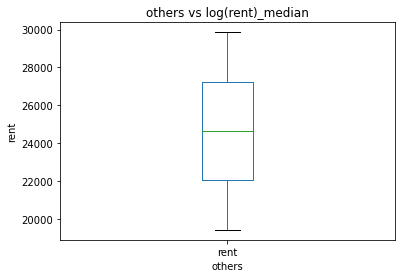

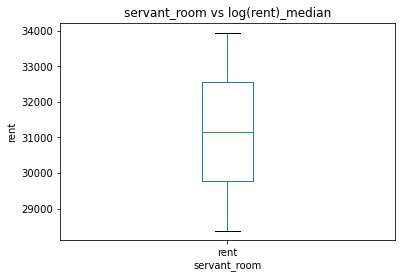

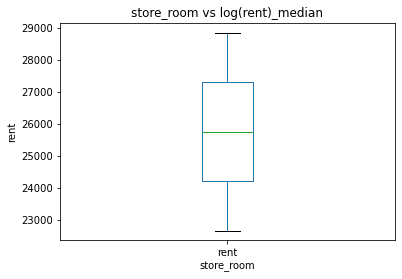

In [62]:
for feature in dis_features:
    df.groupby(feature)[target].mean().plot.box()
    
    plt.xlabel(feature)
    plt.ylabel(target)
    plt.title('{} vs log({})_median'.format(feature, target))
    plt.show()

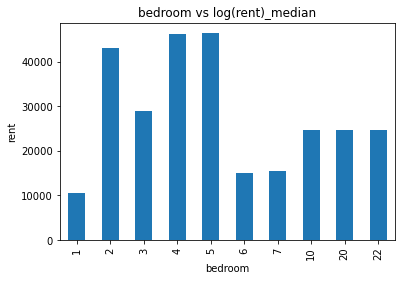

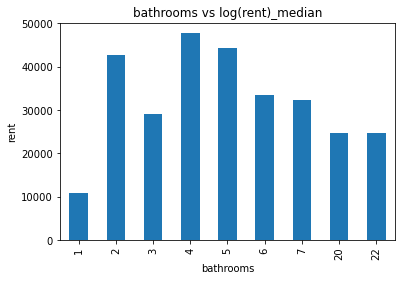

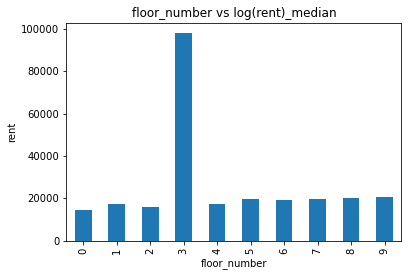

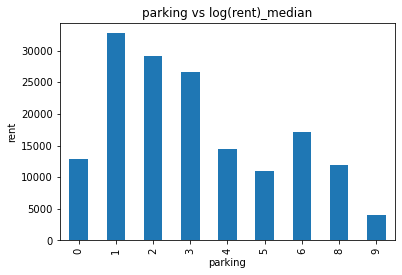

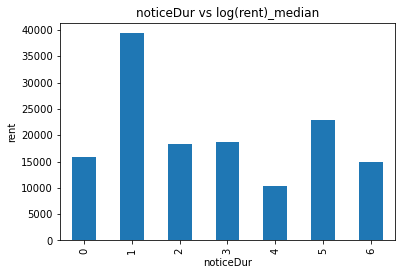

...

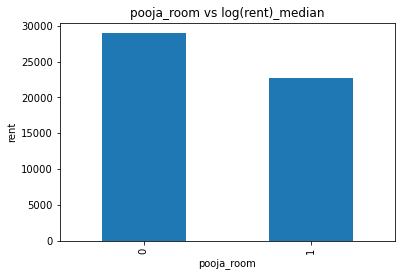

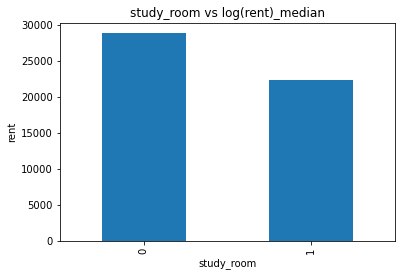

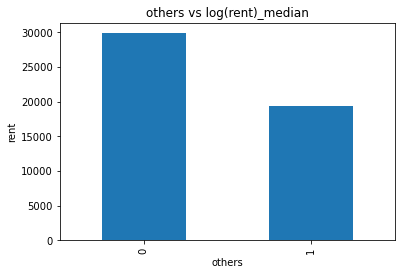

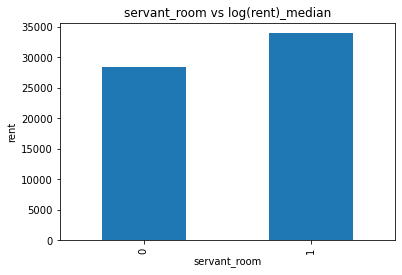

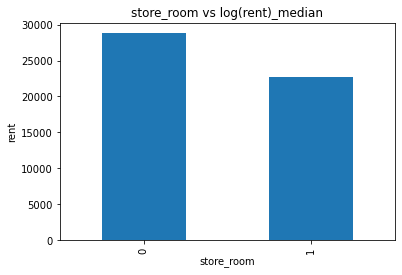

In [63]:
for feature in dis_features:
    df.groupby(feature)[target].mean().plot.bar()
    
    plt.xlabel(feature)
    plt.ylabel(target)
    plt.title('{} vs log({})_median'.format(feature, target))
    plt.show()

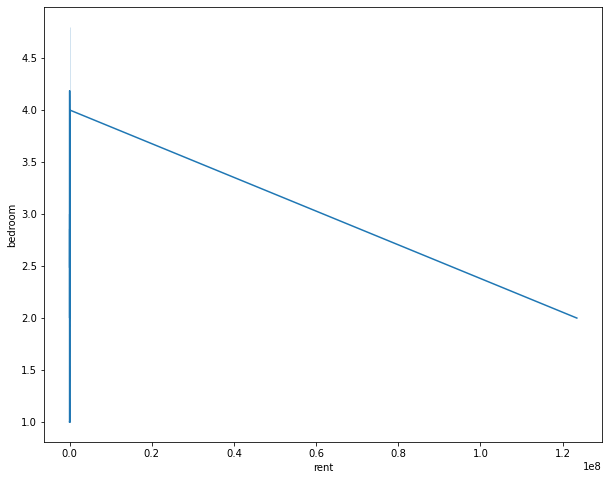

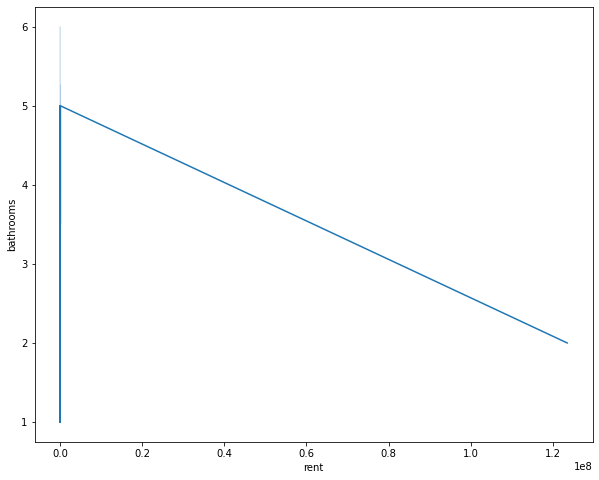

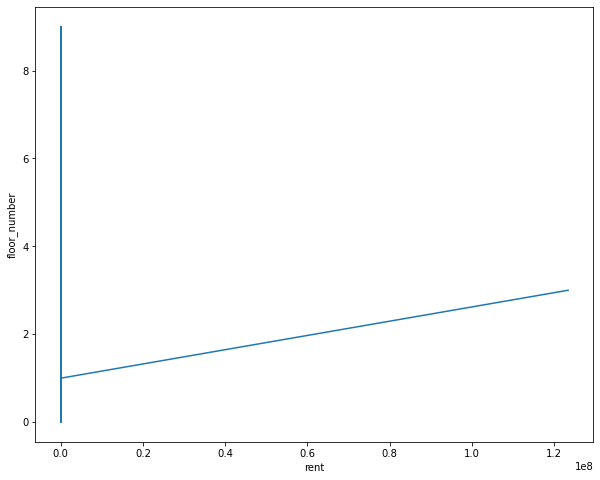

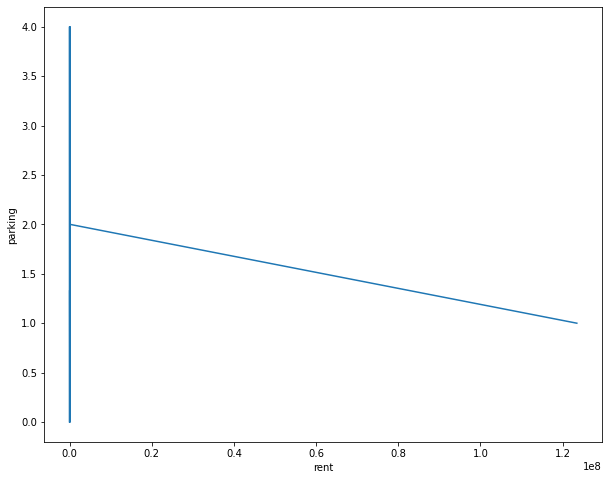

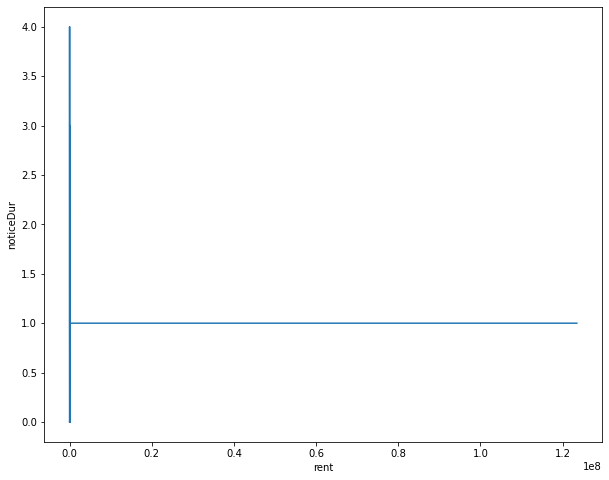

...

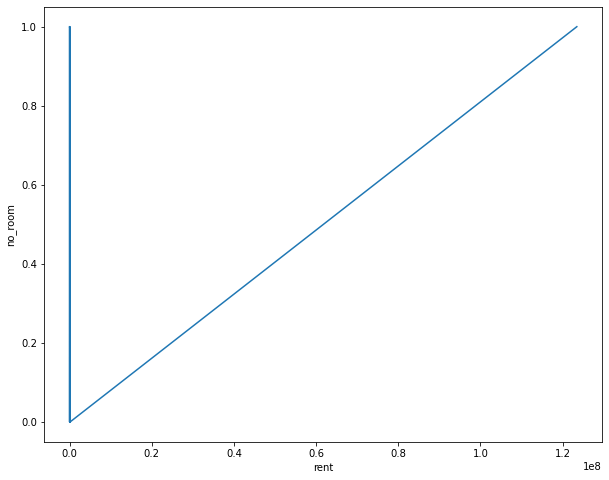

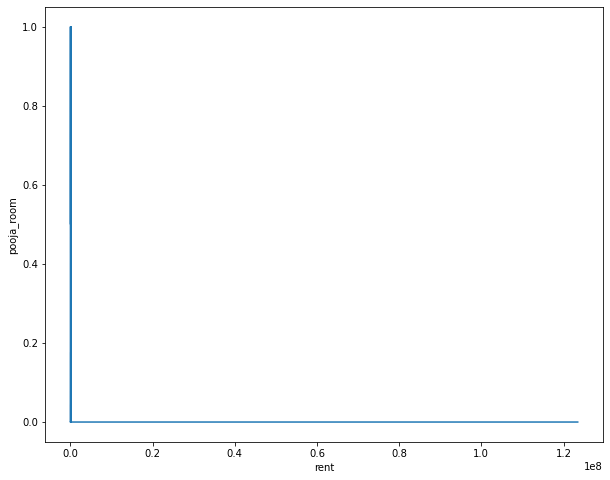

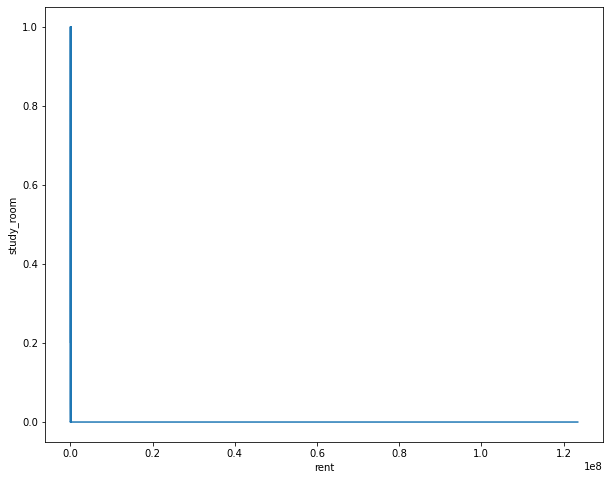

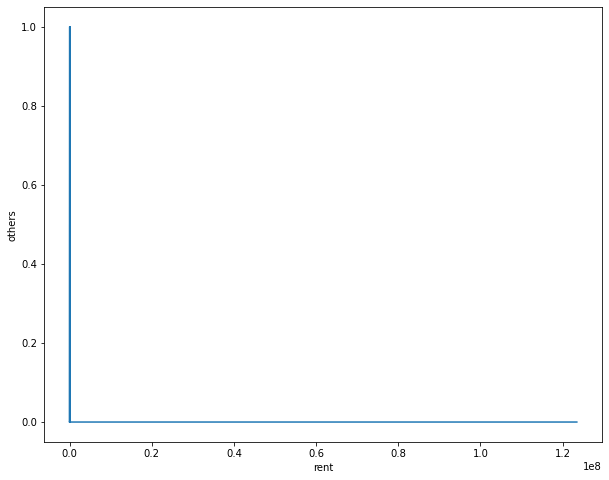

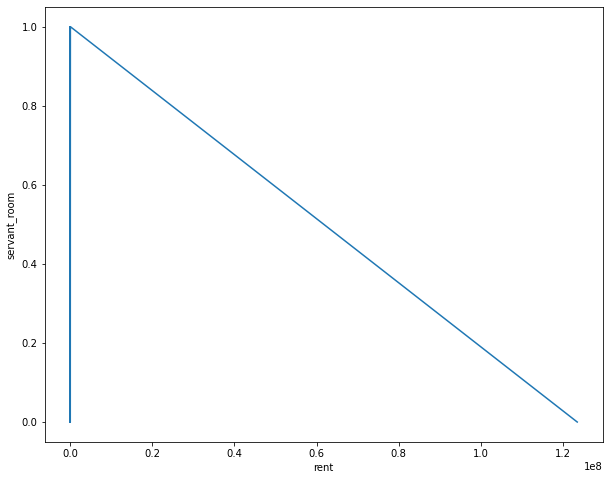

In [64]:
rand = 0
for i in dis_features:
    rand = rand + 1
    if rand < 13: # total 14 columns but we don't need output columns
        figure = plt.figure(figsize=(10,8))
        sns.lineplot(x="rent",y=i,data=df)
        plt.show()
    else:
        break

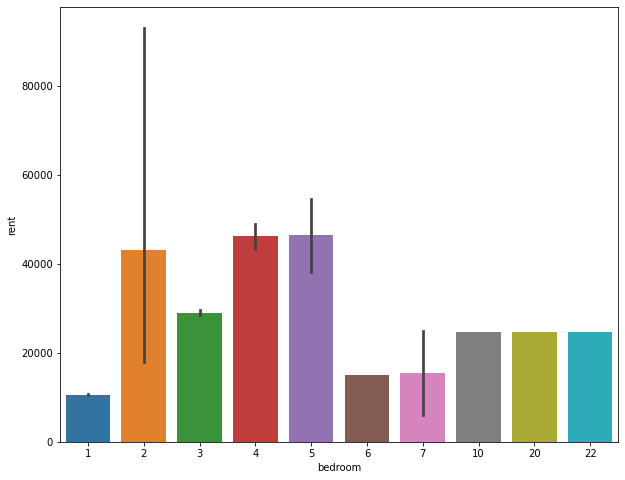

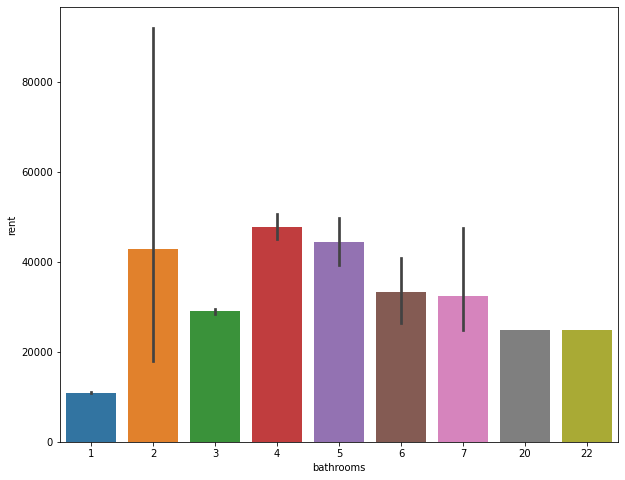

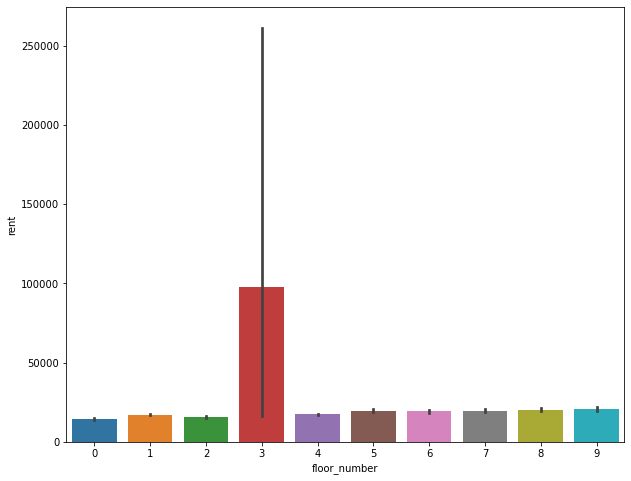

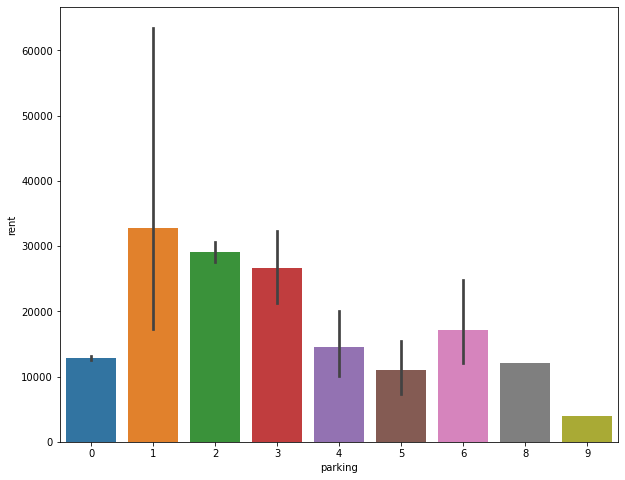

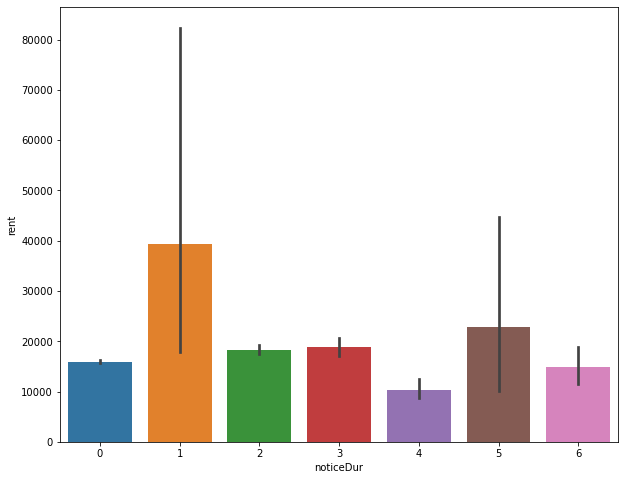

...

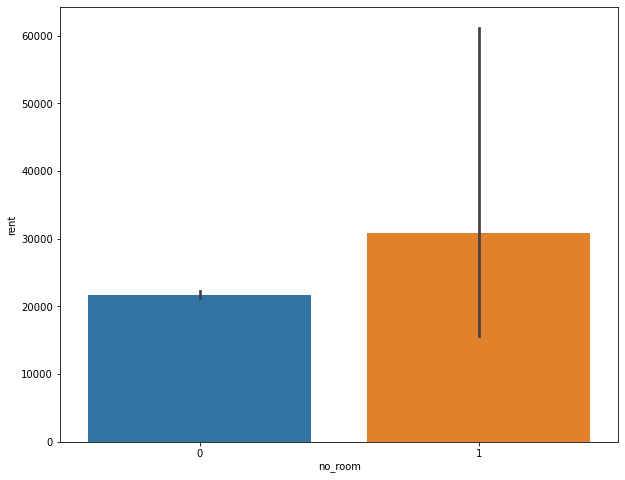

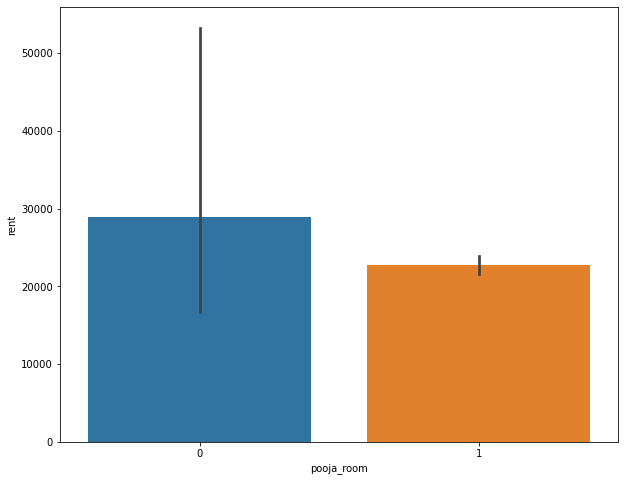

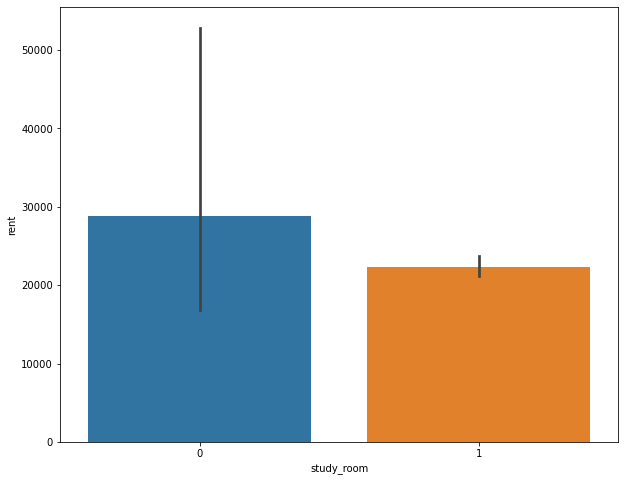

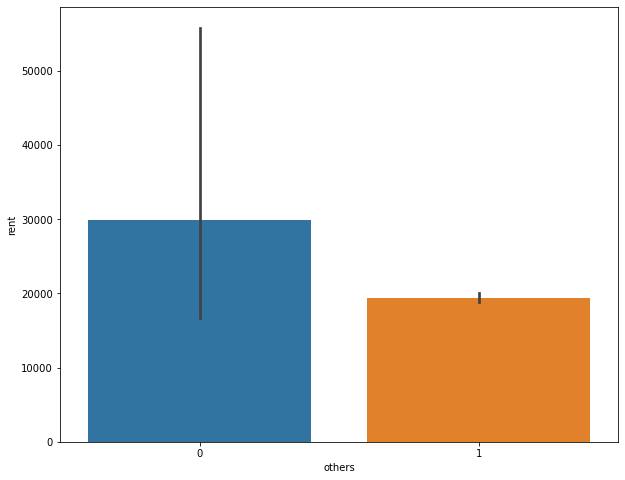

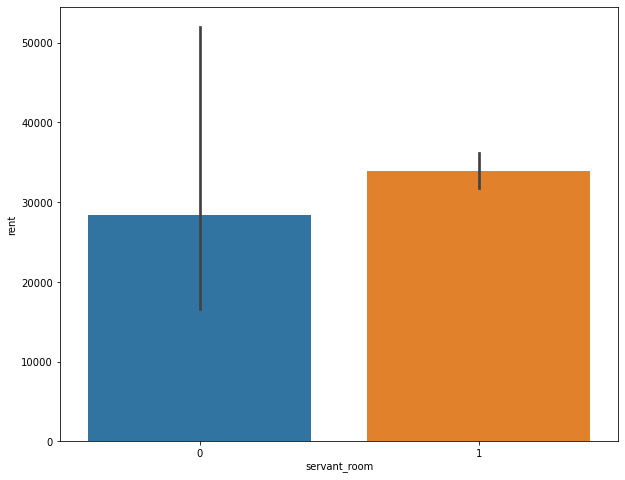

In [65]:
rand = 0
for i in dis_features:
    rand = rand + 1
    if rand < 13: # total 14 columns but we don't need output columns
        figure = plt.figure(figsize=(10,8))
        sns.barplot(x= i ,y="rent",data=df)
        plt.show()
    else:
        break

In [66]:
cat_features = [feature for feature in df.columns if feature not in num_features and feature != target]

df[cat_features].head()

,furnishing,avalable_for,address,facing,floor_type,gate_community,corner_pro,wheelchairadption,petfacility,propertyage,maintenance_amt
0,Unfurnished,All,"Sadguru hights, Pingale Wasti, , Pune, Maharas...",West,Marble,Yes,No,None,None,5 to 10 Year Old,0
1,Unfurnished,All,"Manav Silver Springs, Wagholi, , Pune, Maharas...",East,Vitrified,Yes,Yes,None,None,1 to 5 Year Old,0
2,Semifurnished,All,"Saarrthi Souvenir, Mahalunge, , Pune, Maharashtra",South-West,Vitrified,Yes,No,None,None,1 to 5 Year Old,Maintenance 1/ (/ month
3,Furnished,Family Only,"Dhan Residency, Wanowrie, , Pune, Maharashtra",East,Mosaic,Yes,No,None,None,10+ Year Old,0
4,Semifurnished,"Family , Bachelors (Men Only)","Saptsiddhi Savali Homes, Uruli Devachi, , Pune...",South,Polished concrete,Yes,Yes,None,None,1 to 5 Year Old,0


In [67]:
for feature in cat_features:
    print('{}: {} categories'.format(feature, len(df[feature].unique())))

furnishing: 3 categories
avalable_for: 8 categories
address: 6387 categories
facing: 9 categories
floor_type: 15 categories
gate_community: 2 categories
corner_pro: 2 categories
wheelchairadption: 2 categories
petfacility: 2 categories
propertyage: 6 categories
maintenance_amt: 174 categories


In [72]:
area = list(df['address'].astype(str))

area_new = []

for a in area:
    area_new.append(a[a.find(',') + 1: a.find(',', a.find(',') + 1)])
    
df['address'] = np.array(area_new)

In [73]:
area_mean = {}

for area in np.unique(np.array(area_new)):
    area_mean[area] = df.loc[df['address'] == area]['rent'].mean()
    
df['address_num'] = df['address'].map(area_mean)

In [74]:
df[target] = np.log(df[target])

In [75]:
df.drop(['maintenance_amt', 'address'], axis = 1, inplace = True)

In [78]:
df.drop(['bathrooms'], axis = 1, inplace = True)

In [79]:
df

,bedroom,area,furnishing,avalable_for,floor_number,facing,floor_type,gate_community,corner_pro,parking,...,pooja_room,study_room,others,servant_room,store_room,brok_amt,deposit_amt,mnt_amt,rent,address_num
0,2,1050.0,Unfurnished,All,5,West,Marble,Yes,No,0,...,0,0,0,0,0,0,3,0.0,9.903488,21700.000000
1,2,760.0,Unfurnished,All,5,East,Vitrified,Yes,Yes,2,...,0,0,0,0,0,0,40000,0.0,9.546813,12649.223409
2,3,0.0,Semifurnished,All,1,South-West,Vitrified,Yes,No,1,...,0,0,1,0,0,23000,60000,1.0,10.043206,17396.448276
3,1,628.0,Furnished,Family Only,3,East,Mosaic,Yes,No,1,...,0,0,0,0,0,0,40000,0.0,9.472705,24577.586207
4,2,668.0,Semifurnished,"Family , Bachelors (Men Only)",6,South,Polished concrete,Yes,Yes,1,...,0,0,0,0,0,0,20,0.0,8.922658,9400.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10879,2,750.0,Unfurnished,Family Only,0,South,Vitrified,Yes,No,1,...,0,0,1,0,0,15000,30000,0.0,9.615805,20350.000000
10880,2,0.0,Unfurnished,All,4,East,Not provided,No,No,1,...,0,0,1,0,0,0,22000,0.0,9.305651,13957.142857
10881,3,2390.0,Unfurnished,Family Only,9,West,Vitrified,Yes,Yes,2,...,0,0,0,1,0,55000,180000,0.0,10.915088,20630.463576
10882,2,563.0,Semifurnished,"Family , Bachelors (Women Only)",2,No Direction,Concrete,Yes,No,1,...,0,0,0,0,0,0,3,0.0,9.546813,12649.223409


In [83]:
dummy_df = pd.get_dummies(df, drop_first = True)

print(dummy_df.shape)
dummy_df.head()

(10884, 59)


,bedroom,area,floor_number,parking,aggDur,noticeDur,lightbill,powerbackup,no_room,pooja_room,...,floor_type_Wood,gate_community_Yes,corner_pro_Yes,wheelchairadption_Yes,petfacility_Yes,propertyage_1 to 5 Year Old,propertyage_10+ Year Old,propertyage_5 to 10 Year Old,propertyage_NO age,propertyage_Under Construction
0,2,1050.0,5,0,11,2,0,2,1,0,...,0,1,0,0,0,0,0,1,0,0
1,2,760.0,5,2,11,1,0,2,1,0,...,0,1,1,0,0,1,0,0,0,0
2,3,0.0,1,1,11,1,0,2,0,0,...,0,1,0,0,0,1,0,0,0,0
3,1,628.0,3,1,11,1,0,0,1,0,...,0,1,0,0,0,0,1,0,0,0
4,2,668.0,6,1,12,1,1,1,1,0,...,0,1,1,0,0,1,0,0,0,0


In [84]:
x = dummy_df.drop(['rent'], axis = 1)
y = dummy_df['rent']

In [85]:
xTrain,xTest,yTrain,yTest = train_test_split(x,y,test_size=0.20,random_state=42)

In [86]:
lm = LinearRegression().fit(xTrain,yTrain)

In [87]:
ridge = Ridge().fit(xTrain,yTrain)

In [88]:
lasso = Lasso().fit(xTrain,yTrain)

In [89]:
knnr = KNeighborsRegressor().fit(xTrain,yTrain)

In [90]:
rfr = RandomForestRegressor(random_state=42,verbose=False).fit(xTrain,yTrain)

In [91]:
xgbr = XGBRegressor().fit(xTrain,yTrain)

In [93]:
models = [lm,ridge,lasso,knnr,rfr,xgbr]

In [94]:
for model in models:
    name = model.__class__.__name__
    R2CV = cross_val_score(model,xTest,yTest,cv=10,scoring="r2").mean()
    error = -cross_val_score(model,xTest,yTest,cv=10,scoring="neg_mean_squared_error").mean()
    print(name + ": ")
    print("-" * 30)
    print(R2CV)
    print(np.sqrt(error))
    print("-" * 30)

LinearRegression: 
------------------------------
0.4962827799272378
0.3723401669191893
------------------------------
Ridge: 
------------------------------
0.49696338509047244
0.3720945500010989
------------------------------
Lasso: 
------------------------------
0.23457355193328883
0.45710935098327266
------------------------------
KNeighborsRegressor: 
------------------------------
0.7251263811809581
0.27319536103284436
------------------------------
RandomForestRegressor: 
------------------------------
0.8034803689812824
0.23178066943092154
------------------------------
XGBRegressor: 
------------------------------
0.8150543274495657
0.22456037566540127
------------------------------


In [95]:
r = pd.DataFrame(columns=["MODELS","R2CV"])

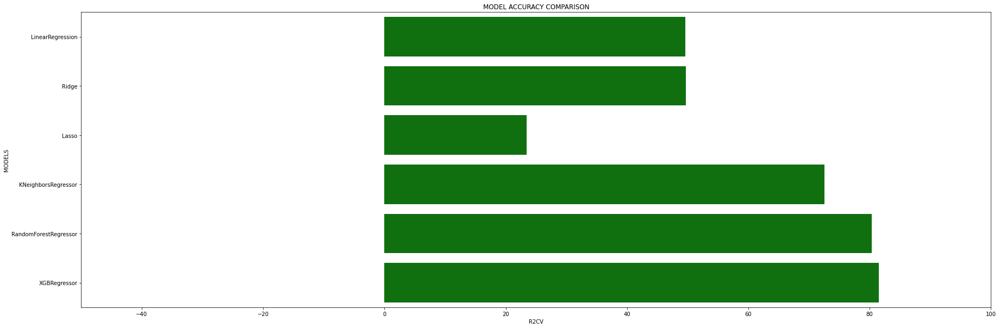

In [96]:
for model in models:
    name = model.__class__.__name__
    R2CV = cross_val_score(model,xTest,yTest,cv=10,scoring="r2").mean()
    result = pd.DataFrame([[name,R2CV * 100]],columns=["MODELS","R2CV"])
    r = r.append(result)
figure = plt.figure(figsize=(30,10))
sns.barplot(x="R2CV",y="MODELS",data=r,color="g")
plt.xlabel("R2CV")
plt.ylabel("MODELS")
plt.xlim(-50,100)
plt.title("MODEL ACCURACY COMPARISON")
plt.show()

In [97]:
ols = sm.OLS(yTrain,xTrain).fit()
print(ols.summary())

                                 OLS Regression Results                                
Dep. Variable:                   rent   R-squared (uncentered):                   0.997
Model:                            OLS   Adj. R-squared (uncentered):              0.997
Method:                 Least Squares   F-statistic:                          4.861e+04
Date:                Sat, 10 Jul 2021   Prob (F-statistic):                        0.00
Time:                        04:37:42   Log-Likelihood:                         -6867.6
No. Observations:                8707   AIC:                                  1.385e+04
Df Residuals:                    8649   BIC:                                  1.426e+04
Df Model:                          58                                                  
Covariance Type:            nonrobust                                                  
                                                   coef    std err          t      P>|t|      [0.025      0.975]
-------